In [ ]:
!pip install imgaug

# Load and Augment an Image
* Source : https://nbviewer.jupyter.org/github/aleju/imgaug-doc/blob/master/notebooks/A01%20-%20Load%20and%20Augment%20an%20Image.ipynb


## Load and Show an Image


Original:


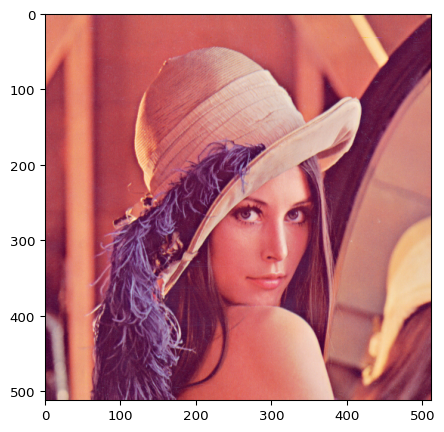

In [ ]:
import imageio
import imgaug as ia
%matplotlib inline

image = imageio.imread("https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png")

print("Original:")
ia.imshow(image)

## Augment the Image


Augmented:


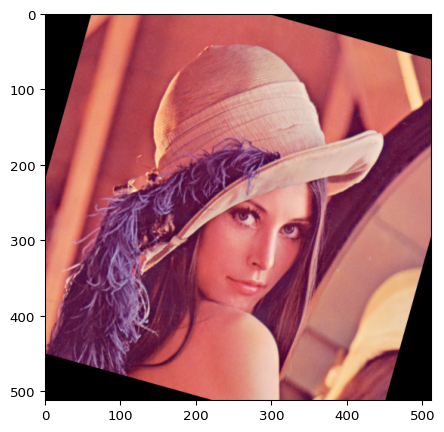

In [ ]:
from imgaug import augmenters as iaa
ia.seed(4)

rotate = iaa.Affine(rotate=(-25, 25))
image_aug = rotate(image=image)

print("Augmented:")
ia.imshow(image_aug)

## Augment a Batch of Images


Augmented batch:


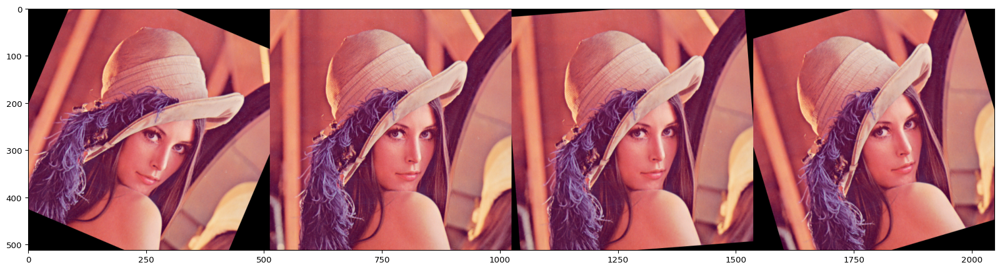

In [ ]:
import numpy as np

images = [image, image, image, image]
images_aug = rotate(images=images)

print("Augmented batch:")
ia.imshow(np.hstack(images_aug))

Augmented:


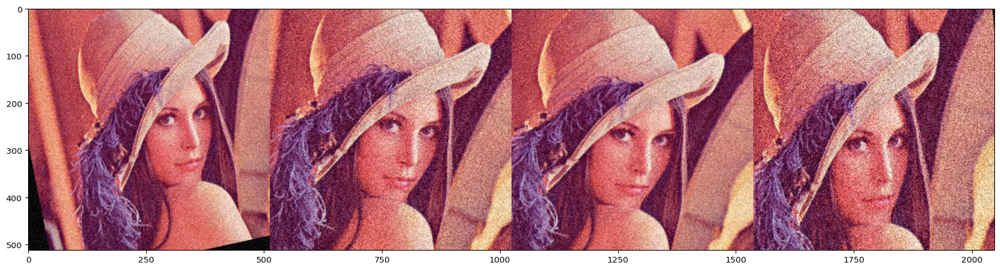

In [ ]:
## Use Many Augmentation Techniques Simultaneously
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(10, 60)),
    iaa.Crop(percent=(0, 0.2))
])

images_aug = seq(images=images)

print("Augmented:")
ia.imshow(np.hstack(images_aug))

In [ ]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(30, 90)),
    iaa.Crop(percent=(0, 0.4))
], random_order=True)

images_aug = [seq(image=image) for _ in range(8)]

print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=2))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# __m="iaa";__k="out";print('\n'.join([_s for _s in dir(eval(__m)) if _s.find(__k) >= 0 ]))
?iaa.cutout

Object `iaa.cutout` not found.


Image 0 (input shape: (257, 286, 3), output shape: (257, 286, 3))


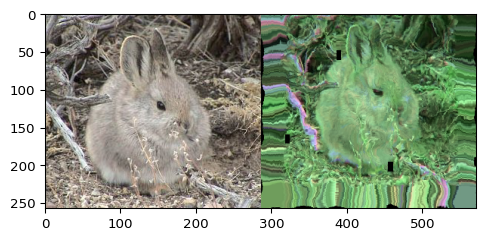

Image 1 (input shape: (536, 800, 3), output shape: (536, 800, 3))


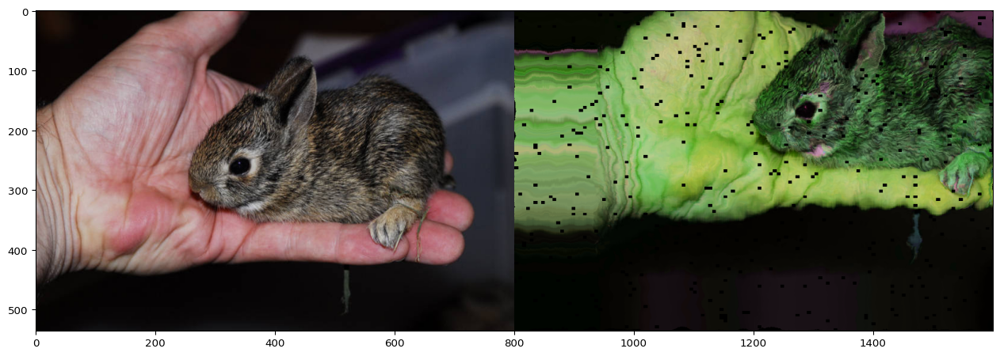

Image 2 (input shape: (289, 520, 3), output shape: (289, 520, 3))


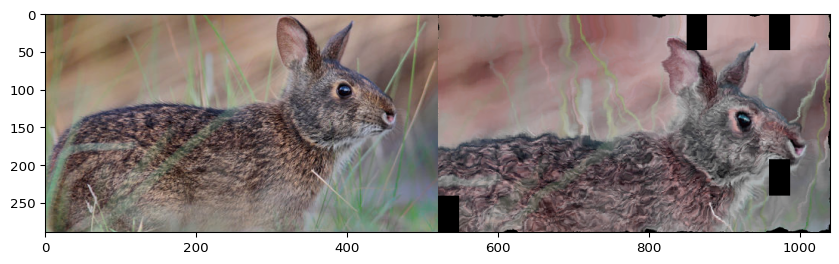

In [ ]:
## Augmenting Images of Different Sizes
seq = iaa.Sequential([
    iaa.CropAndPad(percent=(-0.2, 0.2), pad_mode="edge"),  # crop and pad images
    iaa.AddToHueAndSaturation((-60, 60)),  # change their color
    iaa.ElasticTransformation(alpha=90, sigma=9),  # water-like effect
    iaa.CoarseDropout((0.0, 0.05), size_percent=(0.02, 0.25))  # replace one squared area within the image by a constant intensity value
], random_order=True)

# load images with different sizes
images_different_sizes = [
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/e/ed/BRACHYLAGUS_IDAHOENSIS.jpg"),
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/c/c9/Southern_swamp_rabbit_baby.jpg"),
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/9/9f/Lower_Keys_marsh_rabbit.jpg")
]

# augment them as one batch
images_aug = seq(images=images_different_sizes)

# visualize the results
print("Image 0 (input shape: %s, output shape: %s)" % (images_different_sizes[0].shape, images_aug[0].shape))
ia.imshow(np.hstack([images_different_sizes[0], images_aug[0]]))

print("Image 1 (input shape: %s, output shape: %s)" % (images_different_sizes[1].shape, images_aug[1].shape))
ia.imshow(np.hstack([images_different_sizes[1], images_aug[1]]))

print("Image 2 (input shape: %s, output shape: %s)" % (images_different_sizes[2].shape, images_aug[2].shape))
ia.imshow(np.hstack([images_different_sizes[2], images_aug[2]]))

# Basic Example
* https://imgaug.readthedocs.io/en/latest/source/examples_basics.html

# With Keypoints or Bounding Box

## Example: Augment Images and Keypoints



In [ ]:
import numpy as np
import imgaug.augmenters as iaa

images = np.zeros((2, 128, 128, 3), dtype=np.uint8)  # two example images
images[:, 64, 64, :] = 255
points = [
    [(10.5, 20.5)],  # points on first image
    [(50.5, 50.5), (60.5, 60.5), (70.5, 70.5)]  # points on second image
]

seq = iaa.Sequential([
    iaa.AdditiveGaussianNoise(scale=0.05*255),
    iaa.Affine(translate_px={"x": (1, 5)})
])

# augment keypoints and images
images_aug, points_aug = seq(images=images, keypoints=points)

print("Image 1 center", np.argmax(images_aug[0, 64, 64:64+6, 0]))
print("Image 2 center", np.argmax(images_aug[1, 64, 64:64+6, 0]))
print("Points 1", points_aug[0])
print("Points 2", points_aug[1])


Image 1 center 1
Image 2 center 1
Points 1 [(11.5, 20.5)]
Points 2 [(51.5, 50.5), (61.5, 60.5), (71.5, 70.5)]


## Example: Augment Images and Bounding Boxes



In [ ]:
import numpy as np
import imgaug as ia
import imgaug.augmenters as iaa

images = np.zeros((2, 128, 128, 3), dtype=np.uint8)  # two example images
images[:, 64, 64, :] = 255
polygons = [
    [ia.Polygon([(10.5, 10.5), (50.5, 10.5), (50.5, 50.5)])],
    [ia.Polygon([(0.0, 64.5), (64.5, 0.0), (128.0, 128.0), (64.5, 128.0)])]
]

seq = iaa.Sequential([
    iaa.AdditiveGaussianNoise(scale=0.05*255),
    iaa.Affine(translate_px={"x": (1, 5)})
])

images_aug, polygons_aug = seq(images=images, polygons=polygons)

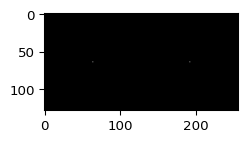

In [ ]:
ia.imshow(np.hstack([images[0], images[0]]))

# Example: Visualize Augmented Non-Image Data



In [ ]:
import numpy as np
import imgaug as ia

image = np.zeros((64, 64, 3), dtype=np.uint8)



## points

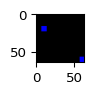

In [ ]:
kps = [ia.Keypoint(x=10.5, y=20.5), ia.Keypoint(x=60.5, y=60.5)]
kpsoi = ia.KeypointsOnImage(kps, shape=image.shape)
image_with_kps = kpsoi.draw_on_image(image, size=7, color=(0, 0, 255))
ia.imshow(image_with_kps)


# bbs



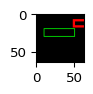

In [ ]:
bbsoi = ia.BoundingBoxesOnImage([
    ia.BoundingBox(x1=10.5, y1=20.5, x2=50.5, y2=30.5)
], shape=image.shape)
image_with_bbs = bbsoi.draw_on_image(image)
image_with_bbs = ia.BoundingBox(
    x1=50.5, y1=10.5, x2=100.5, y2=16.5
).draw_on_image(image_with_bbs, color=(255, 0, 0), size=3)
ia.imshow(image_with_bbs)


# polygons


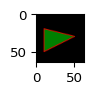

In [ ]:

psoi = ia.PolygonsOnImage([
    ia.Polygon([(10.5, 20.5), (50.5, 30.5), (10.5, 50.5)])
], shape=image.shape)
image_with_polys = psoi.draw_on_image(
    image, alpha_points=0, alpha_face=0.5, color_lines=(255, 0, 0))
ia.imshow(image_with_polys)


In [ ]:
image_with_polys.__class__

numpy.ndarray


# heatmaps


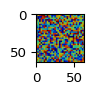

In [ ]:
hms = ia.HeatmapsOnImage(np.random.random(size=(32, 32, 1)).astype(np.float32),
                         shape=image.shape)
image_with_hms = hms.draw_on_image(image)
ia.imshow(np.array( image_with_hms[0]) )

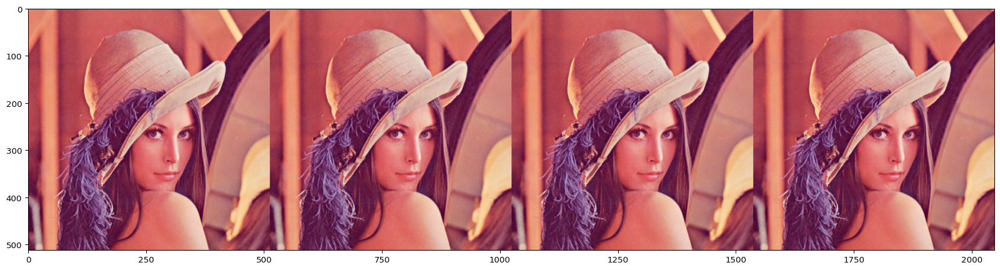

In [ ]:
from imgaug import augmenters as iaa
import numpy as np

image = imageio.imread("https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png")
images = [image, image, image, image]
ia.imshow(np.hstack(images))


## always horizontally flip each input image


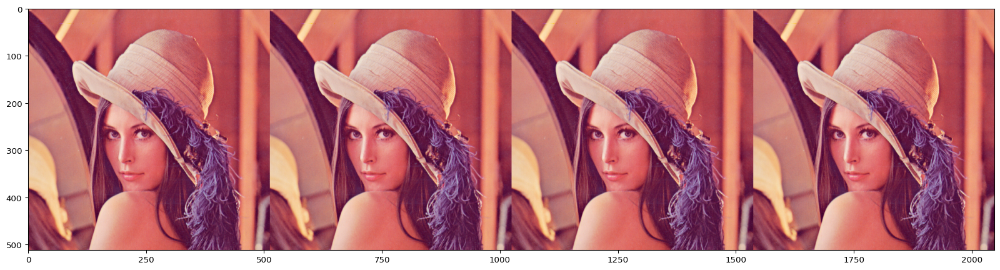

In [ ]:
images_aug = iaa.Fliplr(1.0)(images=images)
ia.imshow(np.hstack(images_aug))



## vertically flip each input image with 90% probability


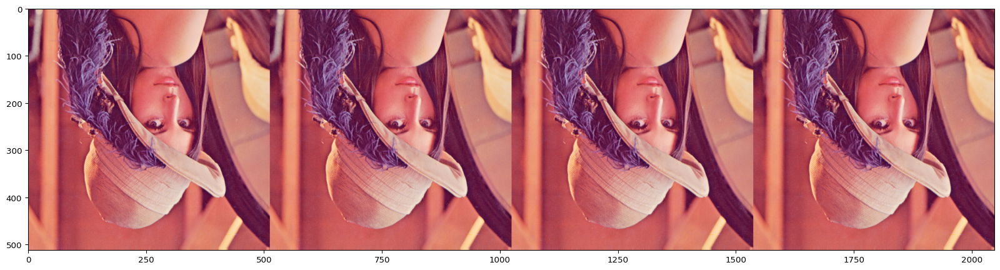

In [ ]:
images_aug = iaa.Flipud(0.9)(images=images)
ia.imshow(np.hstack(images_aug))



## blur 50% of all images using a gaussian kernel with a sigma of 3.0


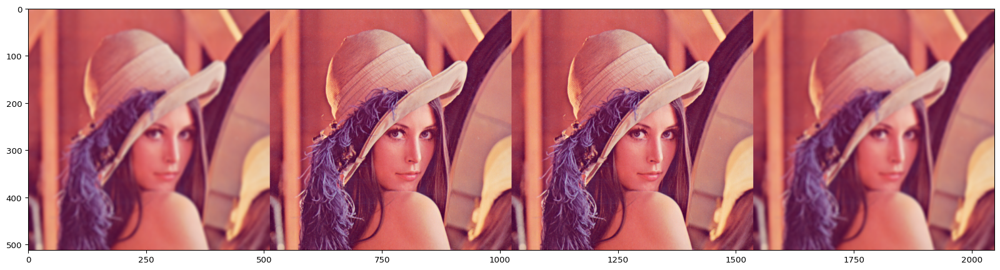

In [ ]:
images_aug = iaa.Sometimes(0.5, iaa.GaussianBlur(3.0))(images=images)
ia.imshow(np.hstack(images_aug))

Output hidden; open in https://colab.research.google.com to view.